# INTRNLP Twitter

Insert short introduction here.

# Import Modules

In [1]:
from collections import Counter
from nltk.stem import WordNetLemmatizer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
import emoji
import matplotlib.pyplot as plt
import nltk
import numpy as np
import os
import pandas as pd
import re

In [2]:
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /home/jupyter-
[nltk_data]     reynaldo_delimajr/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/jupyter-
[nltk_data]     reynaldo_delimajr/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

# Load Data

In [3]:
def check_data_exists(data):
    return os.path.exists(data)

In [4]:
# If all_tweets.csv exist, read the file as ease
# Otherwise, read and append all subsets of data, then export .csv
if check_data_exists("all_tweets.csv"):
    df = pd.read_csv("all_tweets.csv")
    df.drop(["Unnamed: 0"], inplace=True, axis=1)
else:
    for i in range(0, 24):
        if i == 0:
            df = pd.read_csv(f"Data/tweets_{i}.csv")
        else:
            more_df = pd.read_csv(f"Data/tweets_{i}.csv")
            df = df.append(more_df, ignore_index=True)
    df.to_csv("all_tweets.csv")

/opt/tljh/user/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


df = pd.read_csv('Data/tweets_0.csv')
df_1 = pd.read_csv('Data/tweets_1.csv')

In [5]:
df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text
0,1.264847e+18,3.031065e+08,2020-05-25 17:14:30,tl,@alphangela bes wag ganyan ang attitude char i...
1,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow
2,1.264847e+18,1.074248e+18,2020-05-25 17:14:30,tl,@Kookie07Jeon Can't stop laughing tf HAHAHAHAH...
3,1.264847e+18,1.010402e+18,2020-05-25 17:14:30,tl,@azilhanna09 HAHAHAHHAHAHAHHAAA ML NA LANG
4,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...


# Preprocessing

Let's check if there are any null values.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5869655 entries, 0 to 5869654
Data columns (total 5 columns):
 #   Column            Dtype  
---  ------            -----  
 0   tweet_id          float64
 1   author_id         float64
 2   created_at_utc+8  object 
 3   lang              object 
 4   text              object 
dtypes: float64(2), object(3)
memory usage: 223.9+ MB


There are no null values in the corpus. We can start checking the texts. Before that, we will acquire all of the English texts available in the corpus.

In [7]:
df["lang"].unique()

array(['tl', 'en', 'und', 'et', 'es', 'ko', 'nl', 'tr', 'in', 'hi', 'fi',
       'pt', 'de', 'it', 'ca', 'ht', 'pl', 'lt', 'hu', 'sv', 'el', 'cy',
       'da', 'fr', 'cs', 'no', 'eu', 'lv', 'ja', 'sl', 'vi', 'is', 'ro',
       'ar', 'th', nan, 'zh', 'ur', 'ru', 'iw', 'bn', 'ne', 'ta', 'te',
       'am', 'km', 'pa', 'ml', 'mr', 'fa', 'uk', 'hy', 'bg', 'gu', 'sr',
       'dv'], dtype=object)

In [8]:
eng_df = df[df["lang"] == "en"]
eng_df = eng_df.reset_index()
eng_df.drop(["index"], inplace=True, axis=1)
eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...


In [9]:
eng_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1779586 entries, 0 to 1779585
Data columns (total 5 columns):
 #   Column            Dtype  
---  ------            -----  
 0   tweet_id          float64
 1   author_id         float64
 2   created_at_utc+8  object 
 3   lang              object 
 4   text              object 
dtypes: float64(2), object(3)
memory usage: 67.9+ MB


All of the English tweets are acquired. We will have to clean the texts now. We will store the clean texts as a new column. First, we will remove all `@user` tags since they don't play a role in finding sentiment.

In [10]:
def remove_text_regex(text, regex):
    patterns = re.findall(regex, text)
    for pattern in patterns:
        text = re.sub(pattern, '', text)
    return text

In [11]:
def give_emoji_free_text(text):
    return emoji.get_emoji_regexp().sub(r'', text)

In [12]:
def lemma_text(text):
    new_text = ""
    lemma = WordNetLemmatizer()
    tokens = nltk.word_tokenize(text)
    for token in tokens:
        new_text = new_text + " " + token
    return new_text

In [13]:
def remove_escape_char(text):
    return text.replace('\n', ' ').replace('\r', '').replace('\t', ' ')

In [14]:
def replace_text_lower(text):
    return text.lower()

In [15]:
eng_df["clean_text"] = np.vectorize(remove_text_regex)(eng_df["text"], "@[\w]*")
eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow,Bridgetowne yow
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!,Loveyou!!!
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight,byeee imma listen to the b-tracks #Delight
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPOL SEBASTIAN...


We have our new column to store clean texts. However, we are far from done. Let's check if there are links found in the texts. If links are present, we will remove them as well.

In [16]:
eng_df["clean_text"].head(20)

0                                       Bridgetowne yow
1     One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...
2                                            Loveyou!!!
3            byeee imma listen to the b-tracks #Delight
4      0⃣9⃣3⃣0⃣  3⃣1⃣8⃣  8⃣6⃣8⃣1⃣\nMARIPOL SEBASTIAN...
5               \n\n-cutie pie\n-baby face\n-gorgeous!!
6      0⃣9⃣3⃣0⃣  3⃣1⃣8⃣  8⃣6⃣8⃣1⃣\nMARIPOL SEBASTIAN...
7     No empty carbs day starts tomorrow! Help me. H...
8                                Every wait has a worth
9     Snack Time🥤🍝🍔🍟 from McDonald's  when we crave ...
10    Already out on Spotify \n#baekhyun #Delight #B...
11    Did you all notice those City Lights posters? ...
12    Helluva Summer 🔥 #SummerTime https://t.co/j5BL...
13     I Don't get this?\nI fixed Everything and thi...
14    Not in any way close to what I feel right now....
15                 as in!!! 😍😍😍 https://t.co/102rhUvrnX
16                    Superpower to bring in more POGO?
17             stream candy now https://t.co/Pwz

In [17]:
eng_df["clean_text"] = np.vectorize(remove_text_regex)(eng_df["clean_text"], "https?:\/\/[a-zA-Z0-9._]+\/?[a-zA-Z0-9._]+")
eng_df["clean_text"].head(20)

0                                       Bridgetowne yow
1     One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...
2                                            Loveyou!!!
3            byeee imma listen to the b-tracks #Delight
4      0⃣9⃣3⃣0⃣  3⃣1⃣8⃣  8⃣6⃣8⃣1⃣\nMARIPOL SEBASTIAN...
5               \n\n-cutie pie\n-baby face\n-gorgeous!!
6      0⃣9⃣3⃣0⃣  3⃣1⃣8⃣  8⃣6⃣8⃣1⃣\nMARIPOL SEBASTIAN...
7     No empty carbs day starts tomorrow! Help me. H...
8                                Every wait has a worth
9     Snack Time🥤🍝🍔🍟 from McDonald's  when we crave ...
10    Already out on Spotify \n#baekhyun #Delight #B...
11    Did you all notice those City Lights posters? ...
12                        Helluva Summer 🔥 #SummerTime 
13     I Don't get this?\nI fixed Everything and thi...
14    Not in any way close to what I feel right now....
15                                        as in!!! 😍😍😍 
16                    Superpower to bring in more POGO?
17                                    stream can

As we can notice with the clean texts, there are some `\n` and other string returns that we need to delete. They are not significant after preprocessing.

In [18]:
eng_df['clean_text'] = np.vectorize(remove_escape_char)(eng_df['clean_text'])
eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow,Bridgetowne yow
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...,One of my fav🤧♥️ #백현 #BAEKHYUN #엑소 #EXO #weare...
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!,Loveyou!!!
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight,byeee imma listen to the b-tracks #Delight
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣ MARIPOL SEBASTIAN ...


Now, we are going to remove the emojis.

In [19]:
eng_df["clean_text"] = np.vectorize(give_emoji_free_text)(eng_df["clean_text"])
eng_df.head(10)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow,Bridgetowne yow
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...,One of my fav #백현 #BAEKHYUN #엑소 #EXO #weareone...
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!,Loveyou!!!
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight,byeee imma listen to the b-tracks #Delight
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,MARIPOL SEBASTIAN LAS PIÑAS CITY #Shop...
5,1.264847e+18,8.117382e+17,2020-05-25 17:14:42,en,@Alonzotrishaa\n\n-cutie pie\n-baby face\n-gor...,-cutie pie -baby face -gorgeous!!
6,1.264847e+18,1.246427e+18,2020-05-25 17:14:49,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,MARIPOL SEBASTIAN LAS PIÑAS CITY #Shop...
7,1.264847e+18,7.507069e+17,2020-05-25 17:14:55,en,No empty carbs day starts tomorrow! Help me. H...,No empty carbs day starts tomorrow! Help me. H...
8,1.264847e+18,7.278392e+17,2020-05-25 17:14:55,en,Every wait has a worth,Every wait has a worth
9,1.264847e+18,4.599976e+08,2020-05-25 17:14:56,en,Snack Time🥤🍝🍔🍟 from McDonald's when we crave ...,Snack Time from McDonald's when we crave for ...


We will make all characters in lowercase format to reduce variation.

In [20]:
eng_df['clean_text'] = np.vectorize(replace_text_lower)(eng_df['clean_text'])
eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow,bridgetowne yow
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...,one of my fav #백현 #baekhyun #엑소 #exo #weareone...
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!,loveyou!!!
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight,byeee imma listen to the b-tracks #delight
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,maripol sebastian las piñas city #shop...


In [21]:
eng_df["lemma_text"] = np.vectorize(lemma_text)(eng_df["clean_text"])
eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text,lemma_text
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow,bridgetowne yow,bridgetowne yow
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...,one of my fav #백현 #baekhyun #엑소 #exo #weareone...,one of my fav # 백현 # baekhyun # 엑소 # exo # we...
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!,loveyou!!!,loveyou ! ! !
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight,byeee imma listen to the b-tracks #delight,byeee imma listen to the b-tracks # delight
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,maripol sebastian las piñas city #shop...,maripol sebastian las piñas city # shopee # f...


Now we have our text, we create a separate column for the day, month and year based on `created_at_utc+8` column.

In [22]:
year_list = np.empty(len(eng_df['created_at_utc+8']), dtype=int)
month_list = np.empty(len(eng_df['created_at_utc+8']), dtype=int)
day_list = np.empty(len(eng_df['created_at_utc+8']), dtype=int)

for i in range(len(eng_df['created_at_utc+8'])):
    year_list[i] = int(eng_df['created_at_utc+8'][i][0:4])
    month_list[i] = int(eng_df['created_at_utc+8'][i][5:7])
    day_list[i] = int(eng_df['created_at_utc+8'][i][8:10])
    
eng_df['year'] = year_list
eng_df['month'] = month_list
eng_df['day'] = day_list

In [23]:
eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text,lemma_text,year,month,day
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow,bridgetowne yow,bridgetowne yow,2020,5,25
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...,one of my fav #백현 #baekhyun #엑소 #exo #weareone...,one of my fav # 백현 # baekhyun # 엑소 # exo # we...,2020,5,25
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!,loveyou!!!,loveyou ! ! !,2020,5,25
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight,byeee imma listen to the b-tracks #delight,byeee imma listen to the b-tracks # delight,2020,5,25
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,maripol sebastian las piñas city #shop...,maripol sebastian las piñas city # shopee # f...,2020,5,25


# Hashtags
Now that we preprocessed the data, it's now time to handle the hashtags. Hashtags carry important messages to know the main topic of the tweet.

In [24]:
regex = r"#[\w]*"
hashtags_list = []

for i in range(len(eng_df['clean_text'])):
    candidates = re.findall(regex, eng_df['clean_text'][i])
    # append the candidates into a list
    hashtags_list.append(candidates)
    
# make the list in numpy array format just in case
hashtags_numpy = np.array(hashtags_list, dtype=object)

In [25]:
eng_df['hashtags'] = hashtags_numpy
eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text,lemma_text,year,month,day,hashtags
0,1.264847e+18,2.647676e+09,2020-05-25 17:14:30,en,Bridgetowne yow,bridgetowne yow,bridgetowne yow,2020,5,25,[]
1,1.264847e+18,9.470313e+17,2020-05-25 17:14:31,en,One of my fav🤧♥️\n#백현 #BAEKHYUN #엑소 #EXO #wear...,one of my fav #백현 #baekhyun #엑소 #exo #weareone...,one of my fav # 백현 # baekhyun # 엑소 # exo # we...,2020,5,25,"[#백현, #baekhyun, #엑소, #exo, #weareoneexo, #del..."
2,1.264847e+18,5.696072e+08,2020-05-25 17:14:32,en,@killakushla Loveyou!!!,loveyou!!!,loveyou ! ! !,2020,5,25,[]
3,1.264847e+18,9.167028e+17,2020-05-25 17:14:37,en,byeee imma listen to the b-tracks #Delight,byeee imma listen to the b-tracks #delight,byeee imma listen to the b-tracks # delight,2020,5,25,[#delight]
4,1.264847e+18,1.246427e+18,2020-05-25 17:14:38,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,maripol sebastian las piñas city #shop...,maripol sebastian las piñas city # shopee # f...,2020,5,25,"[#shopee, #frontrow, #gencee, #plemex]"


Here's the tricky part. Since we have all our hashtags into a list, we will define our search space in relation to COVID. That way, we can expand the hashtags we can use for the COVID related tweets.

To do that, we will list these common words when it comes to COVID. This will be our limitations of our scope.
1. covid
2. pandemic
3. quarantine
4. vaccine
5. virus
6. lockdown
7. gcq
8. mecq
9. ecq
10. newnormal
11. facemask

In [26]:
# make a df for covid tweets
covid_eng_df = eng_df.loc[0:0]
covid_eng_df.drop(0, inplace=True)
covid_eng_df

/home/jupyter-reynaldo_delimajr/.local/lib/python3.7/site-packages/pandas/core/frame.py:4908: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,tweet_id,author_id,created_at_utc+8,lang,text,clean_text,lemma_text,year,month,day,hashtags


In [27]:
for i in range(len(eng_df['hashtags'])):
    for hashtag in eng_df['hashtags'][i]:
        # the condition searches if the string you're looking for is in the hashtag, even if it's a variation
        if hashtag.find('covid') != -1 or hashtag.find('pandemic') != -1 or hashtag.find('quarantine') != -1 or hashtag.find('vaccine') != -1 or hashtag.find('virus') != -1 or hashtag.find('lockdown') != -1 or hashtag.find('gcq') != -1 or hashtag.find('mecq') != -1 or hashtag.find('ecq') != -1 or hashtag.find('newnormal') != -1 or hashtag.find('mask') != -1:
            covid_eng_df = covid_eng_df.append(eng_df.loc[i], ignore_index=True)
            print(f'Index {i}')
            print(eng_df['hashtags'][i])

Index 9
['#photooftheday', '#mcdonalds', '#mcdoph', '#lovekoto', '#satisfiedcravings', '#snacktime', '#homesweethome', '#fambam', '#quarantine']
Index 14
['#quarantinecover']
Index 65
['#shopee', '#frontrow', '#gencee', '#plemex', '#tutoktowinsawowowin', '#pandemicperiod']
Index 85
['#wheninecq', '#errands']
Index 132
['#quarantinefood', '#homemade', '#chickencurry', '#curry', '#pinoyfood']
Index 168
['#quarantinefood', '#homemade', '#karekare', '#crispykarekare']
Index 209
['#quarantinefood', '#homemade', '#karekare', '#crispykarekare']
Index 292
['#quarantinefood', '#homemade', '#hamandcheeserolls', '#hamcheese', '#pinoyfood']
Index 458
['#rdinthemetro', '#buhayurban', '#covid19ph']
Index 471
['#quarantine', '#labanlang']
Index 501
['#teampnp', '#weserveandprotect', '#pnpkakampimolabansacovid19']
Index 565
['#stayathomechallenge', '#covid19', '#coronovirusoutbreak', '#coronavirus', '#wakandaforever', '#restrictedmovementordermy', '#lockdown', '#malaysia']
Index 565
['#stayathomechall

In [28]:
covid_eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text,lemma_text,year,month,day,hashtags
0,1.264847e+18,4.599976e+08,2020-05-25 17:14:56,en,Snack Time🥤🍝🍔🍟 from McDonald's when we crave ...,snack time from mcdonald's when we crave for ...,snack time from mcdonald 's when we crave for...,2020,5,25,"[#photooftheday, #mcdonalds, #mcdoph, #lovekot..."
1,1.264847e+18,5.695101e+07,2020-05-25 17:15:10,en,Not in any way close to what I feel right now....,not in any way close to what i feel right now....,not in any way close to what i feel right now...,2020,5,25,[#quarantinecover]
2,1.264848e+18,1.246427e+18,2020-05-25 17:18:10,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,maripol sebastian las piñas city #shop...,maripol sebastian las piñas city # shopee # f...,2020,5,25,"[#shopee, #frontrow, #gencee, #plemex, #tutokt..."
3,1.264849e+18,8.408510e+17,2020-05-25 17:19:22,en,Mask on amd stay safe! \n#whenInEcq \n#errands...,mask on amd stay safe! #wheninecq #errands ...,mask on amd stay safe ! # wheninecq # errands...,2020,5,25,"[#wheninecq, #errands]"
4,1.264849e+18,1.081043e+18,2020-05-25 17:21:43,en,Quarantine Food ‼️‼️‼️\nChicken Curry 💯\n📸 @Fa...,quarantine food chicken curry #quarantin...,quarantine food chicken curry # quarantinefoo...,2020,5,25,"[#quarantinefood, #homemade, #chickencurry, #c..."


In [29]:
covid_eng_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10170 entries, 0 to 10169
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   tweet_id          10170 non-null  float64
 1   author_id         10170 non-null  float64
 2   created_at_utc+8  10170 non-null  object 
 3   lang              10170 non-null  object 
 4   text              10170 non-null  object 
 5   clean_text        10170 non-null  object 
 6   lemma_text        10170 non-null  object 
 7   year              10170 non-null  int64  
 8   month             10170 non-null  int64  
 9   day               10170 non-null  int64  
 10  hashtags          10170 non-null  object 
dtypes: float64(2), int64(3), object(6)
memory usage: 874.1+ KB


We placed the hashtags in another column, we can safely remove them in the `clean_text`.

In [30]:
covid_eng_df['clean_text'] = np.vectorize(remove_text_regex)(covid_eng_df['clean_text'], '#[\w]*')

# VADER
Vader is a library that we will use to acquire the sentiment (positive, neutral, negative) of all of the tweets.

In [31]:
vader = SentimentIntensityAnalyzer()
scores = []

for i in range(len(covid_eng_df)):
    scores.append(vader.polarity_scores(covid_eng_df.loc[i]['clean_text']))
    
scores_numpy = np.array(scores, dtype=object)
covid_eng_df['scores'] = scores_numpy
covid_eng_df.head(5)

,tweet_id,author_id,created_at_utc+8,lang,text,clean_text,lemma_text,year,month,day,hashtags,scores
0,1.264847e+18,4.599976e+08,2020-05-25 17:14:56,en,Snack Time🥤🍝🍔🍟 from McDonald's when we crave ...,snack time from mcdonald's when we crave for ...,snack time from mcdonald 's when we crave for...,2020,5,25,"[#photooftheday, #mcdonalds, #mcdoph, #lovekot...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
1,1.264847e+18,5.695101e+07,2020-05-25 17:15:10,en,Not in any way close to what I feel right now....,not in any way close to what i feel right now.,not in any way close to what i feel right now...,2020,5,25,[#quarantinecover],"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
2,1.264848e+18,1.246427e+18,2020-05-25 17:18:10,en,@gmawowowin 0⃣9⃣3⃣0⃣ 3⃣1⃣8⃣ 8⃣6⃣8⃣1⃣\nMARIPO...,maripol sebastian las piñas city,maripol sebastian las piñas city # shopee # f...,2020,5,25,"[#shopee, #frontrow, #gencee, #plemex, #tutokt...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
3,1.264849e+18,8.408510e+17,2020-05-25 17:19:22,en,Mask on amd stay safe! \n#whenInEcq \n#errands...,mask on amd stay safe! sm cinema marilao,mask on amd stay safe ! # wheninecq # errands...,2020,5,25,"[#wheninecq, #errands]","{'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'comp..."
4,1.264849e+18,1.081043e+18,2020-05-25 17:21:43,en,Quarantine Food ‼️‼️‼️\nChicken Curry 💯\n📸 @Fa...,quarantine food chicken curry,quarantine food chicken curry # quarantinefoo...,2020,5,25,"[#quarantinefood, #homemade, #chickencurry, #c...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."


In [79]:
for i in range(len(covid_eng_df)):
    if covid_eng_df.loc[i]['clean_text'].find('childbirth') != -1:
        print(covid_eng_df.loc[i]['clean_text'])

 what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
 what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
 what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
 what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
  what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
  what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
  what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
  what do people die from? the answer is childbirth. so, childbirth is more dangerous than coronavirus.                   
 what do people die 

In [37]:
months = [5, 6, 7, 8, 9, 10, 11]
scores_list = []
top_words = []
pos_words = []
neg_words = []
neu_words = []

for month in months:
    compound_score = 0
    tweets_total = 0
    all_words = ""
    all_pos_words = ""
    all_neg_words = ""
    all_neu_words = ""
    for i in range(len(covid_eng_df)):
        if covid_eng_df.loc[i]['month'] == month:
            compound_score += covid_eng_df.loc[i]['scores']['compound']
            tweets_total += 1
            all_words += covid_eng_df.loc[i]['clean_text']
            if covid_eng_df.loc[i]['scores']['compound'] > 0:
                all_pos_words += covid_eng_df.loc[i]['clean_text']
            elif covid_eng_df.loc[i]['scores']['compound'] < 0:
                all_neg_words += covid_eng_df.loc[i]['clean_text']
            else:
                all_neu_words += covid_eng_df.loc[i]['clean_text']
    top_words.append(all_words)
    pos_words.append(all_pos_words)
    neg_words.append(all_neg_words)
    neu_words.append(all_neu_words)
    if tweets_total != 0:
        print(f'Month {month} - Compound score: {compound_score} / No. of tweets: {tweets_total} = {compound_score/tweets_total}')
        scores_list.append(compound_score/tweets_total)
    else:
        scores_list.append(0)
        

Month 5 - Compound score: 162.72539999999995 / No. of tweets: 1017 = 0.1600053097345132
Month 6 - Compound score: 526.7104000000007 / No. of tweets: 2856 = 0.1844224089635857
Month 7 - Compound score: 366.0647000000011 / No. of tweets: 2048 = 0.17874252929687554
Month 8 - Compound score: 318.43890000000084 / No. of tweets: 1579 = 0.2016712476250797
Month 9 - Compound score: 166.45980000000043 / No. of tweets: 1024 = 0.16255839843750042
Month 10 - Compound score: 166.33930000000032 / No. of tweets: 945 = 0.1760204232804236
Month 11 - Compound score: 199.15060000000008 / No. of tweets: 701 = 0.2840950071326677


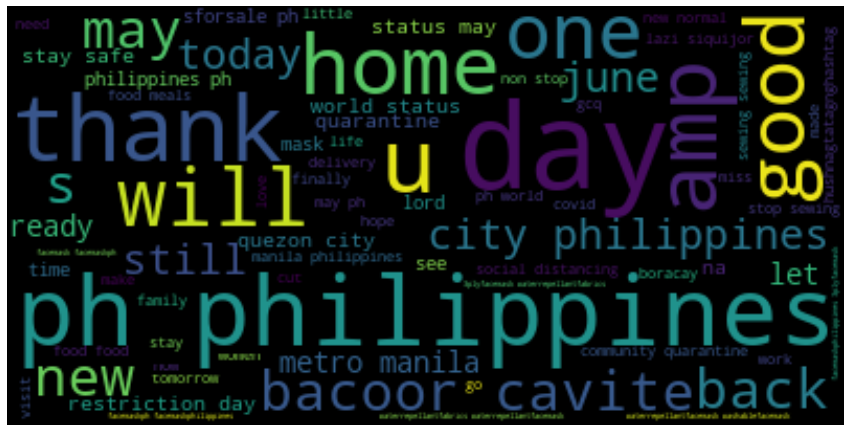

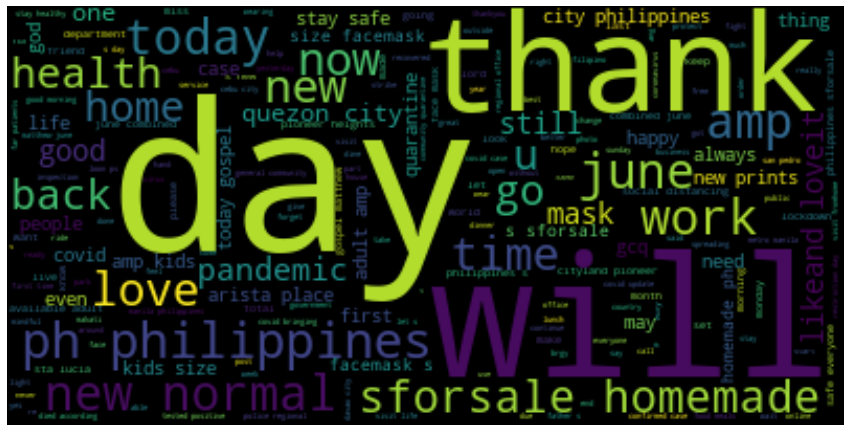

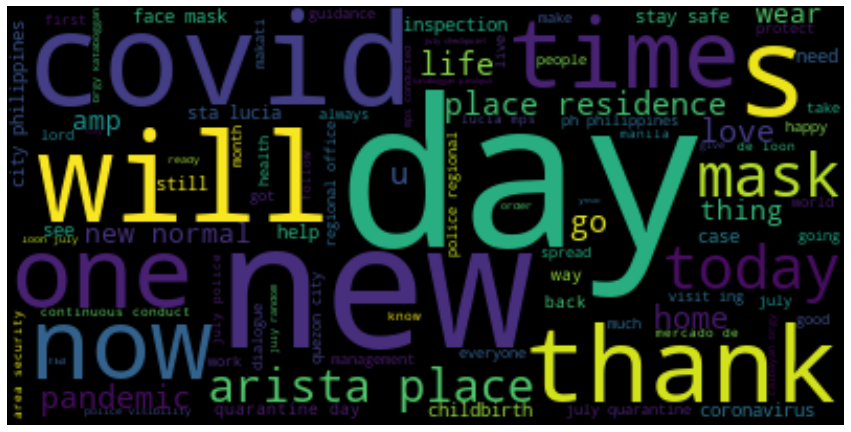

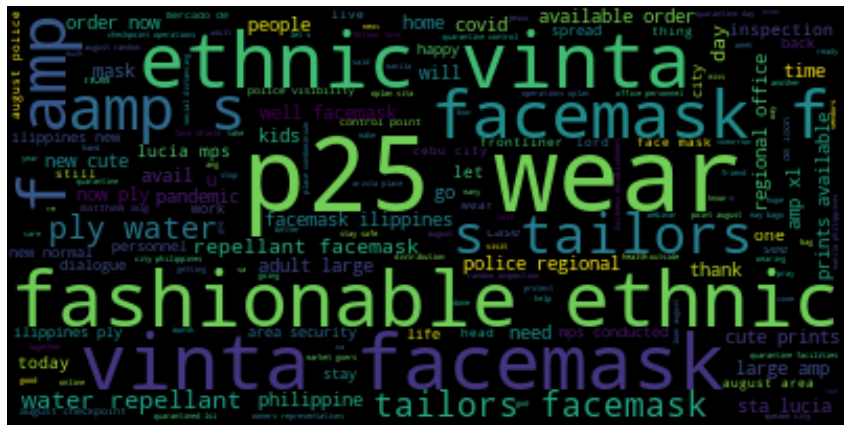

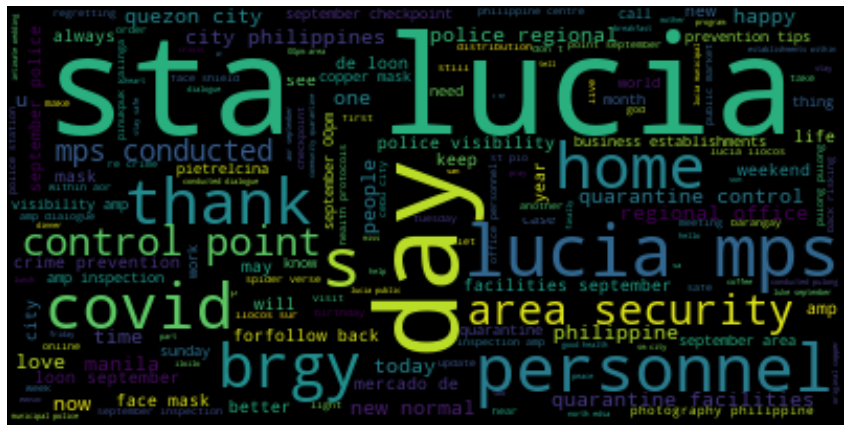

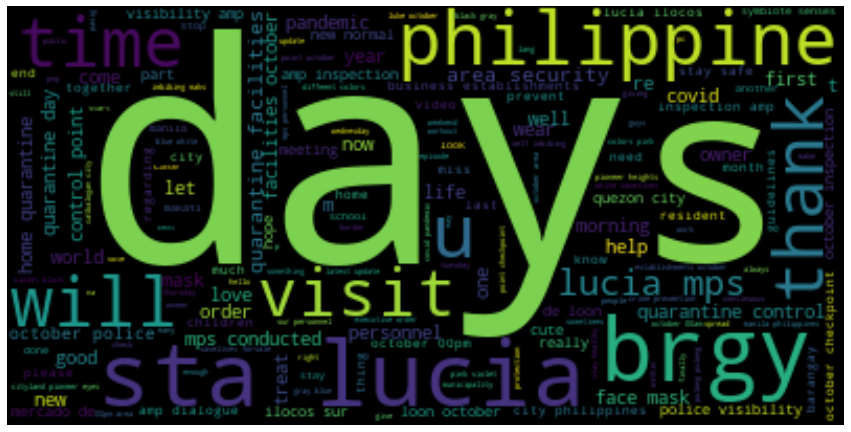

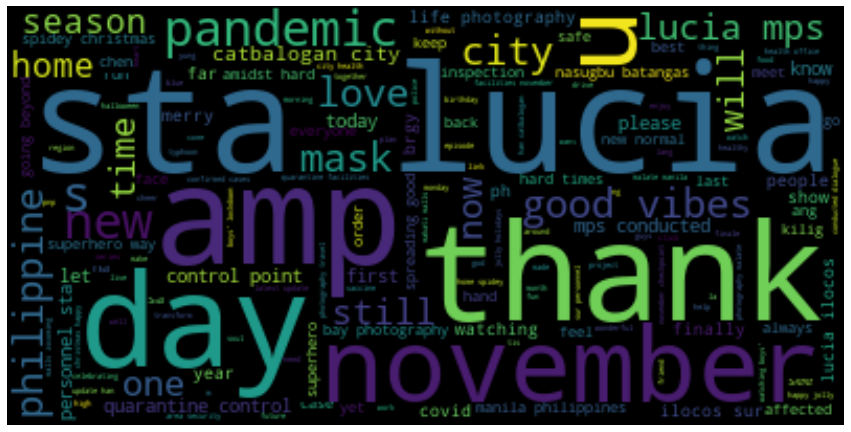

In [38]:
for i in range(len(top_words)):
    word_cloud = WordCloud().generate(top_words[i])
    plt.figure(figsize=(15, 8))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

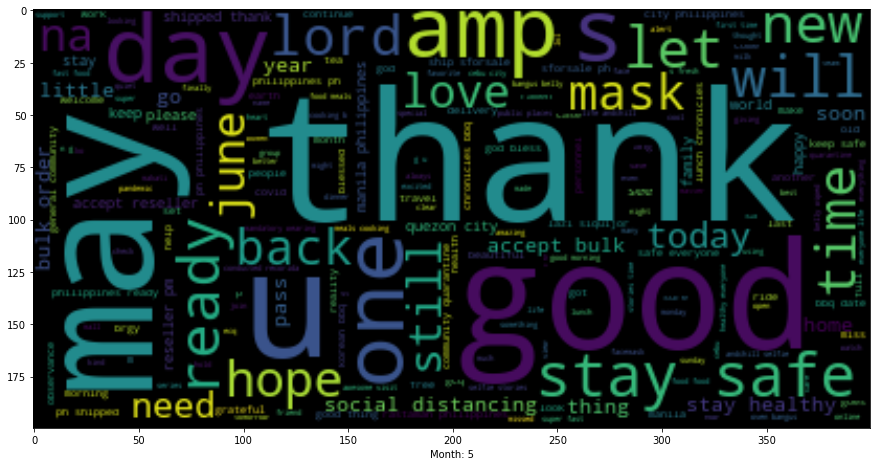

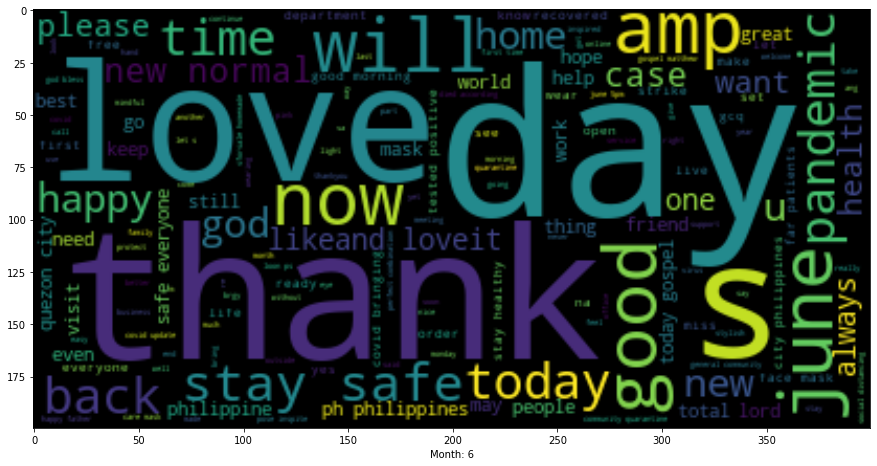

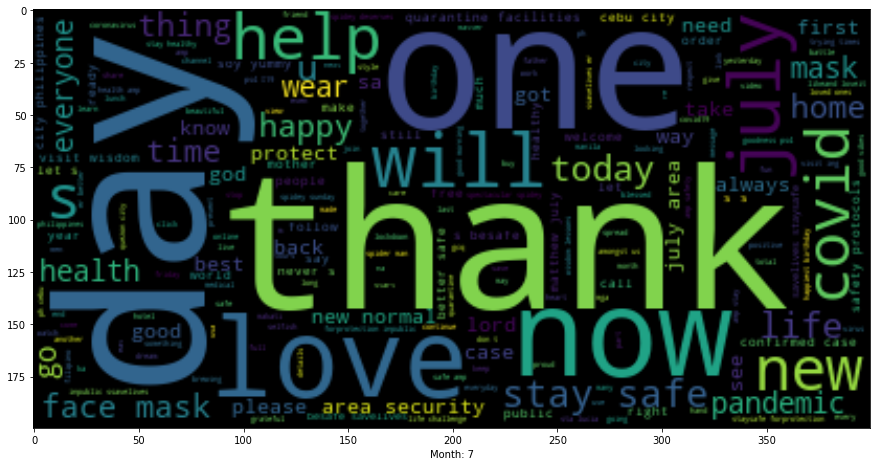

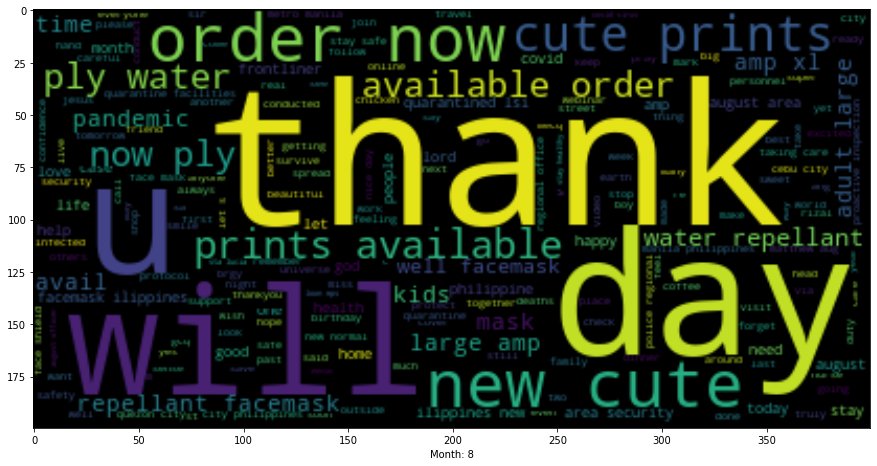

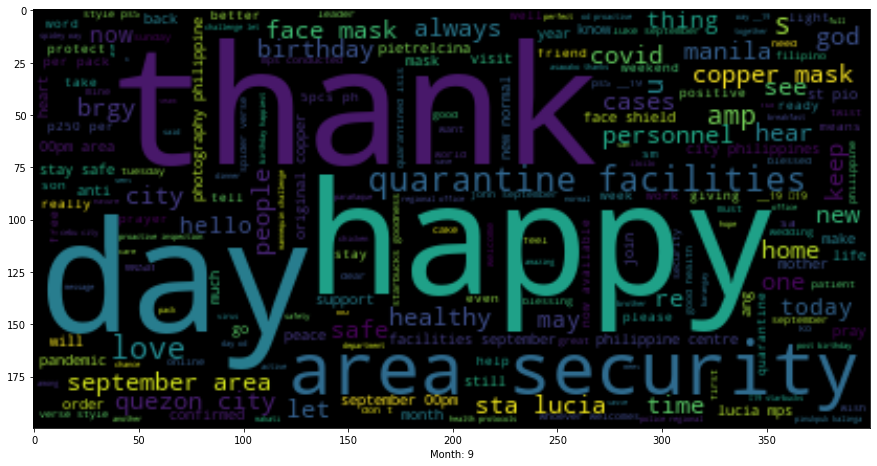

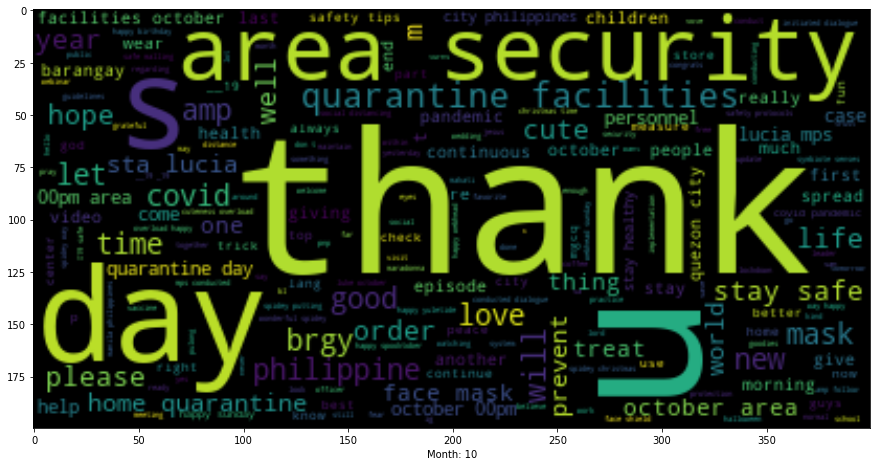

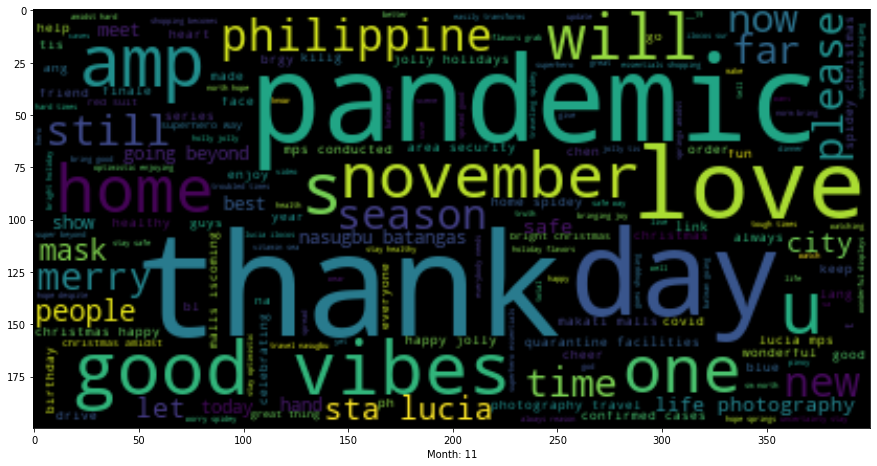

In [75]:
for i in range(len(top_words)):
    word_cloud = WordCloud().generate(pos_words[i])
    plt.figure(figsize=(15, 8))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.xlabel(f'Month: {months[i]}')
    plt.show()

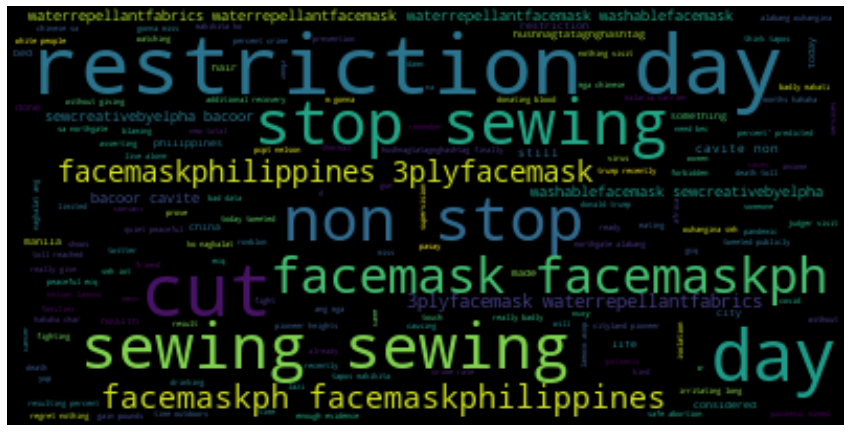

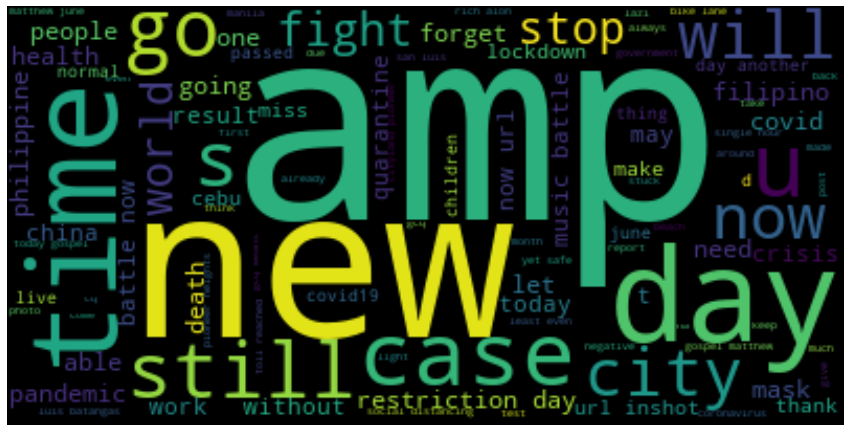

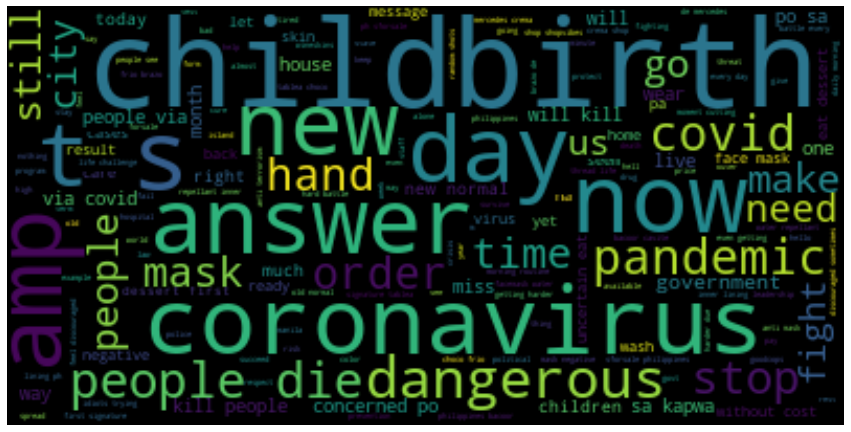

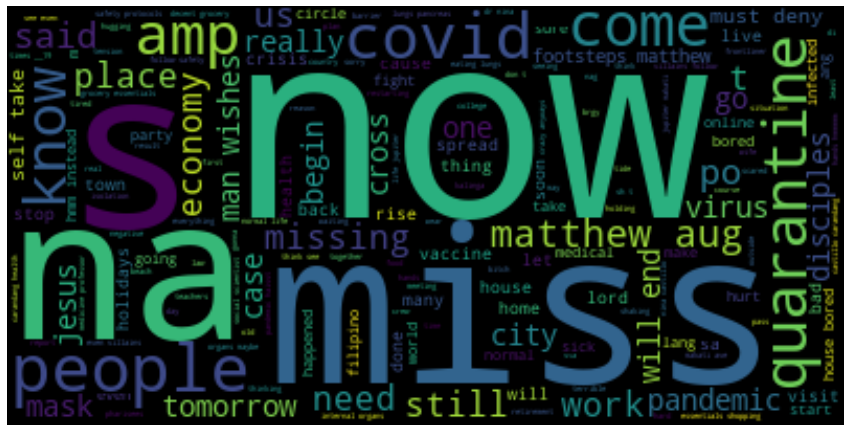

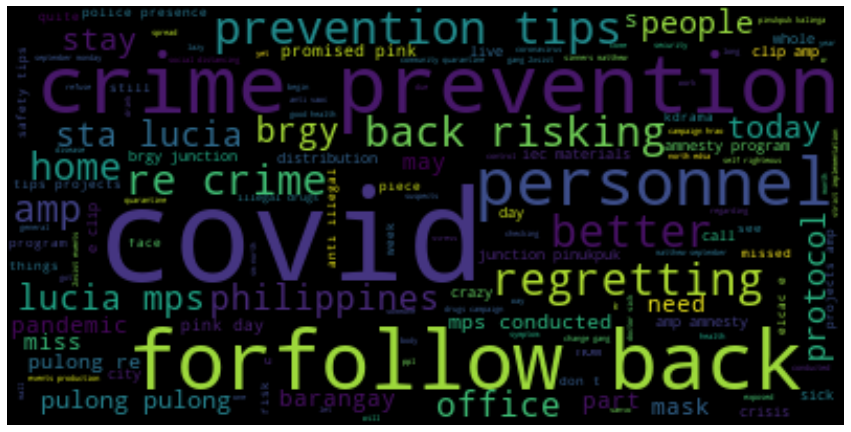

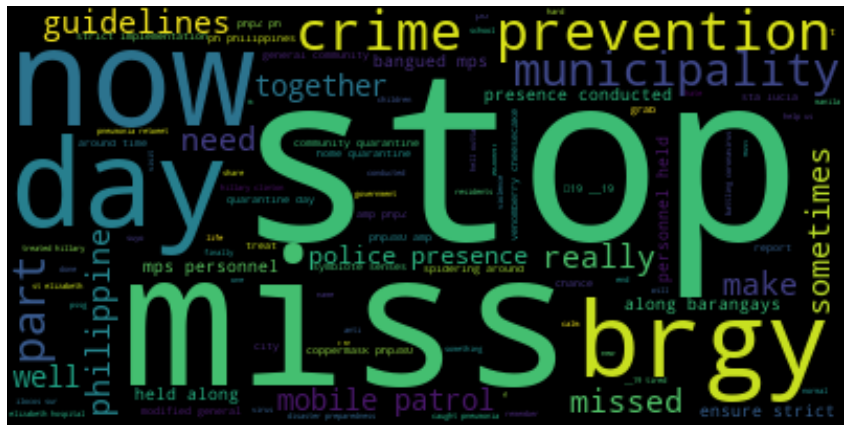

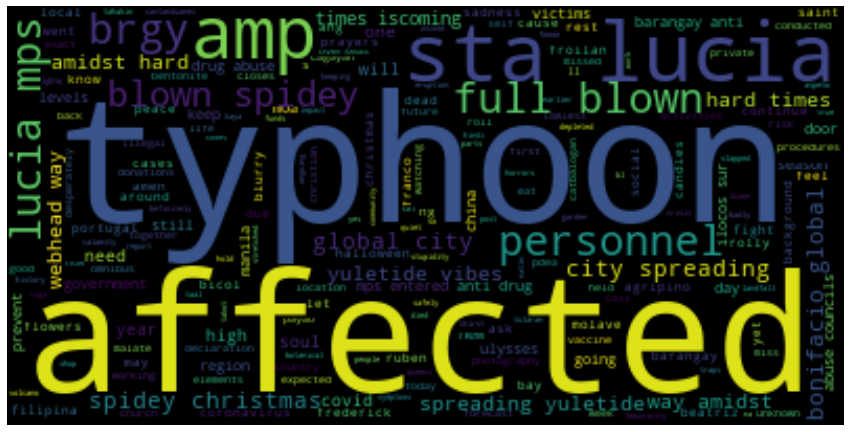

In [76]:
for i in range(len(top_words)):
    word_cloud = WordCloud().generate(neg_words[i])
    plt.figure(figsize=(15, 8))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

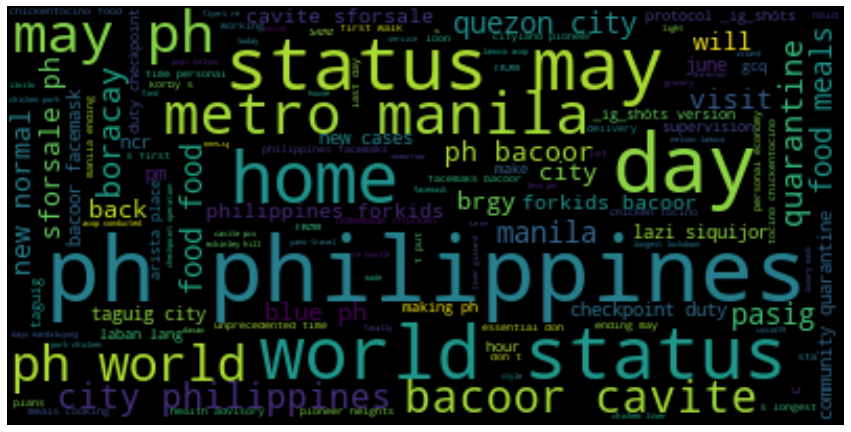

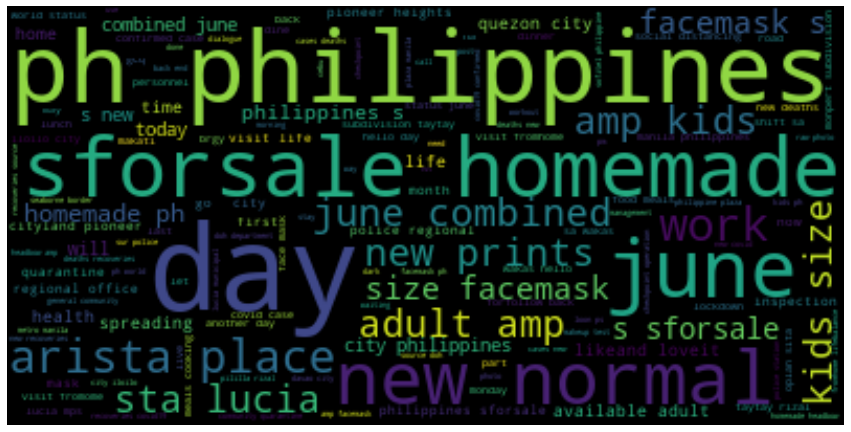

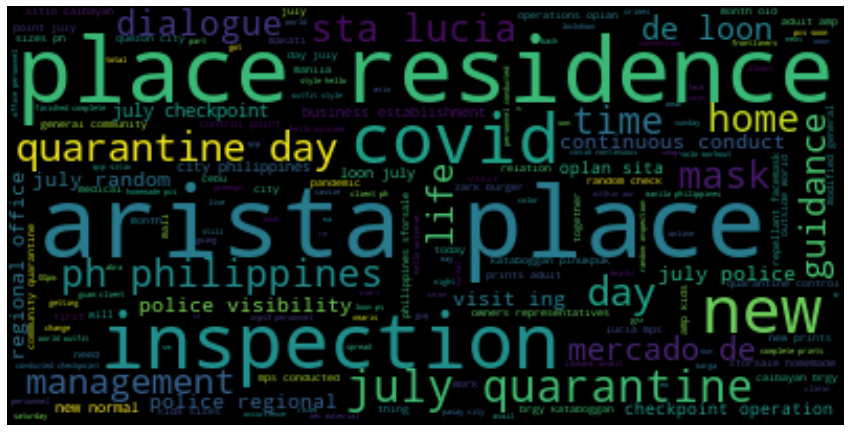

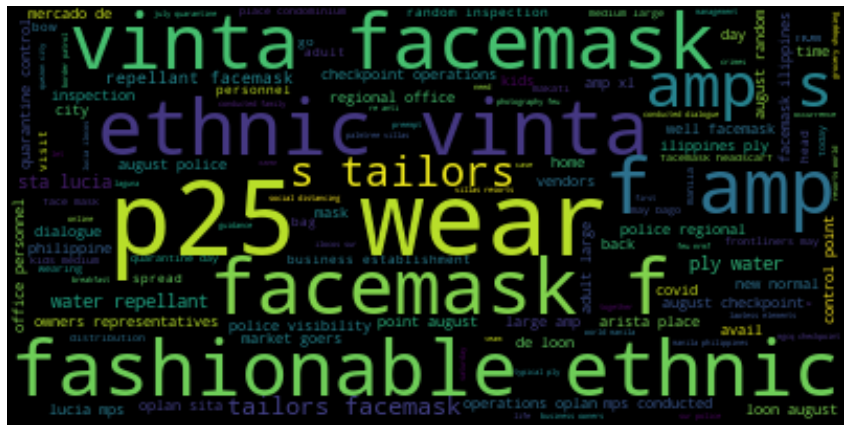

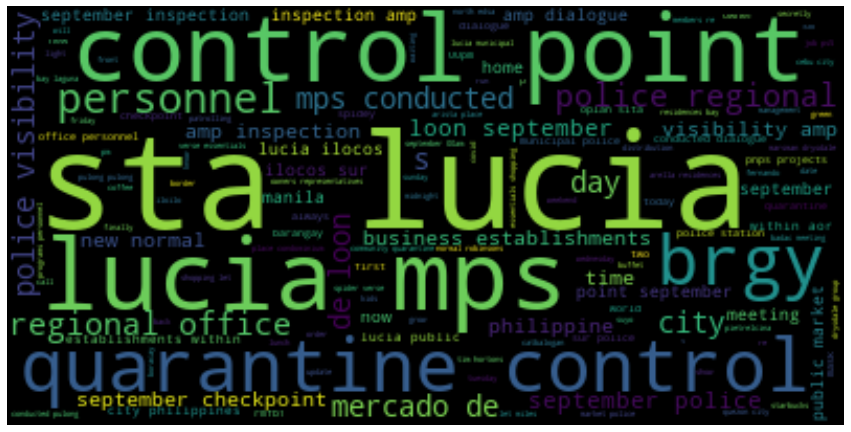

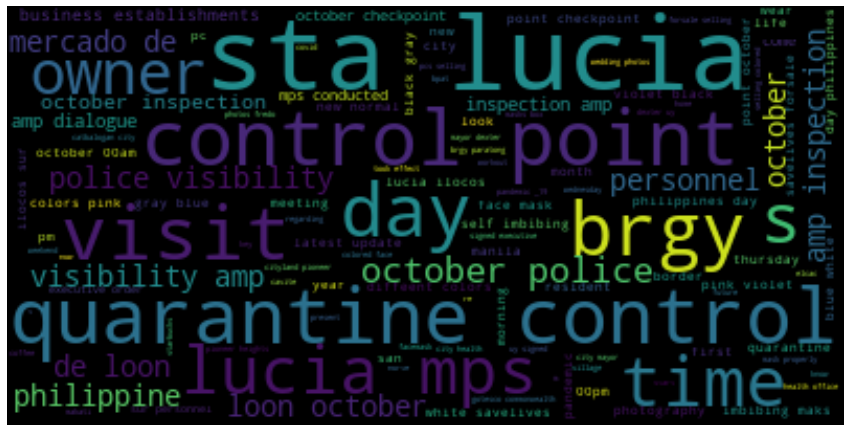

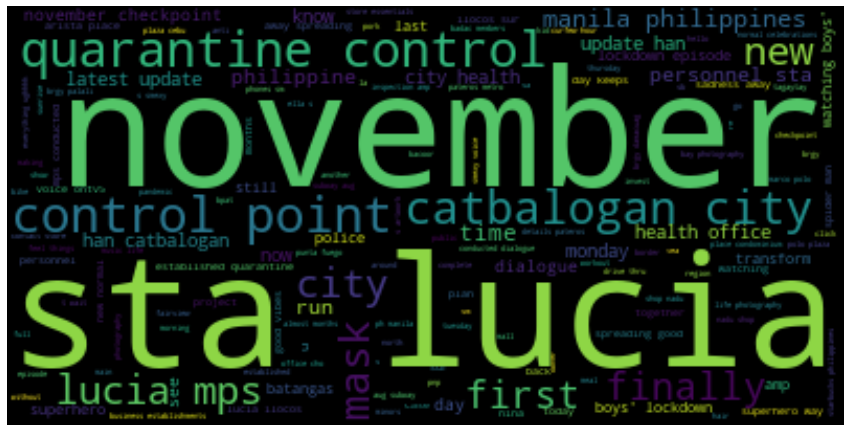

In [77]:
for i in range(len(top_words)):
    word_cloud = WordCloud().generate(neu_words[i])
    plt.figure(figsize=(15, 8))
    plt.imshow(word_cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# TF-IDF

In [39]:
tokenized_tweets = [nltk.word_tokenize(text) for text in covid_eng_df['clean_text']]
tokenized_tweets[0]

['snack',
 'time',
 'from',
 'mcdonald',
 "'s",
 'when',
 'we',
 'crave',
 'for',
 'cheeseburger',
 'mcdo_ph',
 'i',
 'so',
 'likeand',
 'loveit',
 '...',
 '…']

In [41]:
bag_of_words_model = []
for tokens in tokenized_tweets:
    tweet_token_counts = Counter()
    for token in tokens:
        tweet_token_counts.update([token])
    bag_of_words_model.append(tweet_token_counts)
bag_of_words_model[0]

Counter({'snack': 1,
         'time': 1,
         'from': 1,
         'mcdonald': 1,
         "'s": 1,
         'when': 1,
         'we': 1,
         'crave': 1,
         'for': 1,
         'cheeseburger': 1,
         'mcdo_ph': 1,
         'i': 1,
         'so': 1,
         'likeand': 1,
         'loveit': 1,
         '...': 1,
         '…': 1})

In [42]:
token_df = pd.DataFrame(bag_of_words_model)
token_df.fillna(0, inplace=True)
token_df.head()

,snack,time,from,mcdonald,'s,when,we,crave,for,cheeseburger,...,10:00am,themes,motifs,146,qi,mamang,collector,alegria,beary,ton
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [43]:
token_tf_df = (token_df.T / token_df.T.sum()).T
token_tf_df.head()

,snack,time,from,mcdonald,'s,when,we,crave,for,cheeseburger,...,10:00am,themes,motifs,146,qi,mamang,collector,alegria,beary,ton
0,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,0.058824,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [45]:
total_zeros = (token_tf_df == 0).astype(int).sum().sum()
print(f'Total zeros: {total_zeros}')
print(f'Percentage of zeros: {total_zeros / (token_tf_df.shape[0] * token_tf_df.shape[1]) * 100}%')

Total zeros: 146360220
Percentage of zeros: 99.87070597892729%


In [47]:
idf_series = np.log10(token_df.shape[0] / (token_df > 0).sum())

In [48]:
tfidf_df = token_tf_df * idf_series
tfidf_df.head()

,snack,time,from,mcdonald,'s,when,we,crave,for,cheeseburger,...,10:00am,themes,motifs,146,qi,mamang,collector,alegria,beary,ton
0,0.163345,0.083772,0.071632,0.200309,0.07118,0.093964,0.070896,0.186013,0.043621,0.218017,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [52]:
def extract_values(word):
    tfidf_example = pd.DataFrame(columns=['TF', 'IDF', 'TFIDF'])
    tfidf_example['TF'] = token_tf_df[word]
    tfidf_example['IDF'] = idf_series[word]
    tfidf_example['TFIDF'] = tfidf_df[word]
    return tfidf_example

In [67]:
extract_values('covid').sort_values(by=['TFIDF'], ascending=False)

,TF,IDF,TFIDF
9388,0.142857,2.067802,0.295400
822,0.142857,2.067802,0.295400
4629,0.125000,2.067802,0.258475
9710,0.125000,2.067802,0.258475
4628,0.125000,2.067802,0.258475
...,...,...,...
3398,0.000000,2.067802,0.000000
3399,0.000000,2.067802,0.000000
10169,0.000000,2.067802,0.000000
5903,NaN,2.067802,NaN


In [61]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [62]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(covid_eng_df['clean_text'])
print(X)

  (0, 7103)	0.2563612163250862
  (0, 6950)	0.2563612163250862
  (0, 10919)	0.17721469280787513
  (0, 7512)	0.3995051472085602
  (0, 2676)	0.3995051472085602
  (0, 4899)	0.11842365544269981
  (0, 3318)	0.35658041068082946
  (0, 12679)	0.1651498718298685
  (0, 12760)	0.20456634057367512
  (0, 7513)	0.37714951778127725
  (0, 4991)	0.16528792784254426
  (0, 11853)	0.1870484347555974
  (0, 10906)	0.3210910879811062
  (1, 8244)	0.2534746998810127
  (1, 10070)	0.3652727253369641
  (1, 4692)	0.3737909320823066
  (1, 12749)	0.2818951509970985
  (1, 11893)	0.15179409783753875
  (1, 2866)	0.47718607338272756
  (1, 12674)	0.32128532234031143
  (1, 1191)	0.3689124914937377
  (1, 6012)	0.17284116589649876
  (1, 8227)	0.2513943624146466
  (2, 2802)	0.21370280210801143
  (2, 9069)	0.40544294206869386
  :	:
  (10168, 4411)	0.30201642015072283
  (10168, 2502)	0.3319232198972268
  (10168, 4578)	0.2505140480683311
  (10168, 9196)	0.4182527063663585
  (10168, 3438)	0.3107131393368669
  (10168, 7350)	0.2288

In [64]:
tfidf_vectorizer_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names())
tfidf_vectorizer_df.head()

,00,000,001,002,004,005,006,00am,00pm,01,...,𝚏𝚘𝚛𝚎𝚟𝚎𝚛,𝚐𝚘,𝚑𝚊𝚟𝚎,𝚒𝚍𝚎𝚊,𝚗𝚘,𝚛𝚘𝚊𝚍,𝚝𝚑𝚎,𝚝𝚘,𝚢𝚎𝚊𝚛𝚜,𝟚𝟚𝕟𝕕
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [65]:
print(tfidf_df.shape[1])
print(tfidf_vectorizer_df.shape[1])

14410
13216
